# Práctica 3: Caracterización y Clasificación de Texturas
- Martínez Ostoa Néstor Iván
- Ramírez Bondi Jorge Alejandro

# 1. Image Splitting

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import cv2
import os
from PIL import Image
from sklearn.model_selection import train_test_split

INPUT_IMAGES_PATH = 'data/input/'
TRAIN_IMAGES_PATH = 'data/train/'
TEST_IMAGES_PATH = 'data/test/'
MIXED_IMAGES_PATH = 'data/mixed_images/'

In [2]:
def get_image(path):
    return cv2.imread(path)

def convert_to_gray(rgb_image):
    return cv2.cvtColor(rgb_image, cv2.COLOR_BGR2GRAY)

def split_image(image, num_images, verbose=False):
    """
    Splits an image (ndarray) into 'num_images' images and returns the splitted
    images

    Parameters:
    -----------
    'image': numpy ndarray
        'image' must be a squared 2D numpy array 

    'num_images': int
        indicates the number of images to be returned

    Returns:
    --------
    'splitted_images': numpy ndarray
    """
    (width, height) = image.shape
    if width != height: raise Exception('image must be a squared ndarray')
    num_windows = int(np.sqrt(num_images))
    window_size = width // num_windows
    if verbose:
        print(f"\tImage of size ({width}x{height}). Window size: {window_size}")
    splitted_images = []
    y = 0
    while (y+window_size <= height):
        x = 0
        while (x+window_size <= width):
            if verbose: print(f"\t({x},{x+window_size}:{y},{y+window_size})\t", end='')
            splitted_images.append(image[x:x+window_size, y:y+window_size])
            x += window_size
        if verbose: print()
        y += window_size
    return np.array(splitted_images)


def get_dir_contents(path):
    return os.listdir(path)

In [3]:
def get_unique_features(imgs_names):
    features = set()
    for name in imgs_names:
        class_name = name.split('_')[0]
        features.add(class_name)
    return np.array(list(features))

def num_feature_from_string(unique_features, str_feature):
    idx = 0
    for f in unique_features:
        if f == str_feature: return idx
        idx += 1
    return -1

In [4]:
def save_images(imgs, labels, window_size, path):
    try: os.mkdir(path)
    except OSError as error: pass
    for idx, image in enumerate(imgs):
        image_name = 'IM' + str(labels[idx]) + '_SZ' + str(window_size) + '_' + str(idx) + '.png'
        image = Image.fromarray(image)
        image.save(path + image_name)

In [5]:
def image_splitting(data_path, num_windows, verbose=False):
    if verbose: print(f"-----------------------------\nNum Windows: {num_windows}\n-----------------------------")
    input_images = get_dir_contents(data_path)
    input_images = [img_name for img_name in input_images if img_name[0] != '.']
    integer_features = get_unique_features(input_images)
    for img_name in input_images:        
        if verbose: print(f'PROCESSING IMG: {img_name}')
        # Reading texture images
        img_path = INPUT_IMAGES_PATH + img_name
        img = get_image(img_path)
        if verbose: print(f"\tRGB: {img.shape}")

        # Convert rgb to gray image
        gray_img = convert_to_gray(img)
        if verbose: print(f"\tGRAY: {gray_img.shape}")

        # Split into windows
        X = split_image(gray_img, num_windows)
        y = np.repeat(num_feature_from_string(integer_features, img_name), X.shape[0])
        if verbose: print(f"\tX shape: {X.shape}\n\ty shape: {y.shape}")

        # Train test split
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
        if verbose: print(f"\tX_train: {X_train.shape} y_train: {y_train.shape}")
        if verbose: print(f"\tX_test: {X_test.shape} y_test: {y_test.shape}")

        # Image saving
        base_path = str(num_windows) + '/'
        save_images(X_train, y_train, num_windows, path=TRAIN_IMAGES_PATH + base_path)
        save_images(X_test, y_test, num_windows, path=TEST_IMAGES_PATH + base_path)
        


In [6]:
WINDOW_SIZES = [4, 16, 64]
for num_windows in WINDOW_SIZES:
    image_splitting(INPUT_IMAGES_PATH, num_windows, verbose=True if num_windows == 4 else False)

-----------------------------
Num Windows: 4
-----------------------------
PROCESSING IMG: Piedras.jpg
	RGB: (641, 641, 3)
	GRAY: (641, 641)
	X shape: (4, 320, 320)
	y shape: (4,)
	X_train: (3, 320, 320) y_train: (3,)
	X_test: (1, 320, 320) y_test: (1,)
PROCESSING IMG: D16.bmp
	RGB: (640, 640, 3)
	GRAY: (640, 640)
	X shape: (4, 320, 320)
	y shape: (4,)
	X_train: (3, 320, 320) y_train: (3,)
	X_test: (1, 320, 320) y_test: (1,)
PROCESSING IMG: D6.bmp
	RGB: (640, 640, 3)
	GRAY: (640, 640)
	X shape: (4, 320, 320)
	y shape: (4,)
	X_train: (3, 320, 320) y_train: (3,)
	X_test: (1, 320, 320) y_test: (1,)
PROCESSING IMG: D64.bmp
	RGB: (640, 640, 3)
	GRAY: (640, 640)
	X shape: (4, 320, 320)
	y shape: (4,)
	X_train: (3, 320, 320) y_train: (3,)
	X_test: (1, 320, 320) y_test: (1,)
PROCESSING IMG: D49.bmp
	RGB: (640, 640, 3)
	GRAY: (640, 640)
	X shape: (4, 320, 320)
	y shape: (4,)
	X_train: (3, 320, 320) y_train: (3,)
	X_test: (1, 320, 320) y_test: (1,)
PROCESSING IMG: D46.bmp
	RGB: (619, 619, 3)
	GR

# 2. Training

In [7]:
import plotly.graph_objects as go

In [8]:
def read_images(path):
    dir_contents = os.listdir(path)
    dir_contents = [c for c in dir_contents if c[0] != '.']
    imgs = []
    labels = []
    sizes = []
    idxs = []
    for c in dir_contents: 
        img = get_image(path + c)
        gray_img = convert_to_gray(img)
        imgs.append(gray_img)
        splitted_name = c.split('_')
        labels.append(splitted_name[0][2:])
        sizes.append(splitted_name[1][2:])
        idxs.append(splitted_name[2][0])
    imgs = np.array(imgs, dtype='object')
    df = pd.DataFrame({
        'label': labels,
        'window_size': sizes,
        'texture_idx':idxs,
        'image': imgs
    })
    return df.sort_values(['label', 'texture_idx'])

def show_image(img, name=None, cmap='gray'):
    plt.title(name if name is not None else '')
    plt.imshow(img, cmap)
    plt.show()

def histogram_from_image(img, label, window_size):
    vals = [v for row in img for v in row]
    # histogram
    fig = go.Figure()
    fig.add_trace(
        go.Histogram(
            x=vals
        )
    )
    fig.update_layout(
        title=dict(
            text=f'Histograma para la textura: {label} y tamaño de ventana: {window_size}'
        ),
        width=600, height=500
    )
    fig.show()

In [9]:
images_sz4 = read_images(TRAIN_IMAGES_PATH + '4/')
images_sz16 = read_images(TRAIN_IMAGES_PATH + '16/')
images_sz64 = read_images(TRAIN_IMAGES_PATH + '64/')
images_sz4.head()

,label,window_size,texture_idx,image
18,0,4,0,"[[75, 76, 48, 44, 43, 43, 43, 86, 207, 91, 44,..."
19,0,4,1,"[[43, 54, 219, 123, 44, 44, 37, 38, 36, 20, 29..."
20,0,4,2,"[[62, 88, 149, 80, 75, 70, 74, 75, 77, 88, 89,..."
12,1,4,0,"[[221, 219, 212, 212, 211, 207, 203, 196, 199,..."
13,1,4,1,"[[155, 140, 123, 101, 98, 110, 108, 105, 107, ..."


In [10]:
def show_histograms(df):
    seen = set()
    for idx, row in df.iterrows():
        label = row['label']
        if label not in seen:
            seen.add(label)
            show_image(row['image'], 'label:' +row['label'] + ' size: ' + row['window_size'])
            histogram_from_image(row['image'], row['label'], row['window_size'])

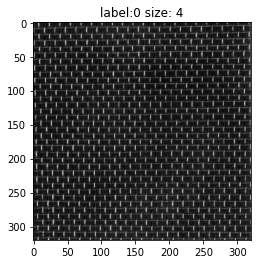

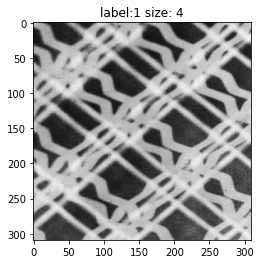

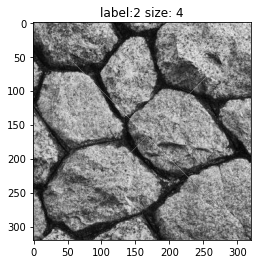

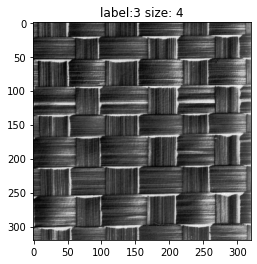

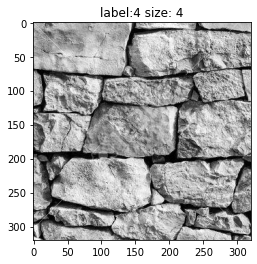

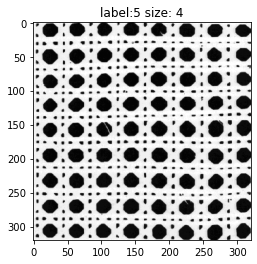

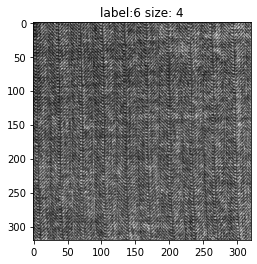

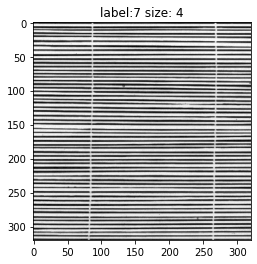

In [11]:
show_histograms(images_sz4)

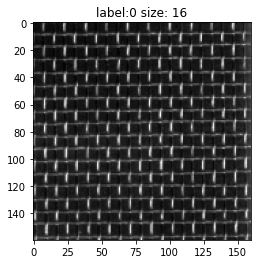

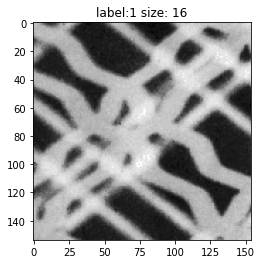

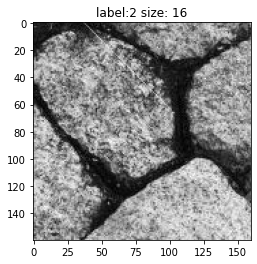

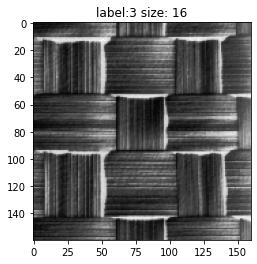

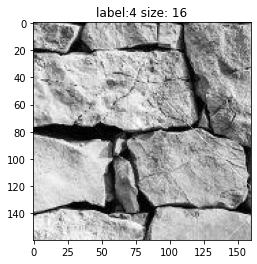

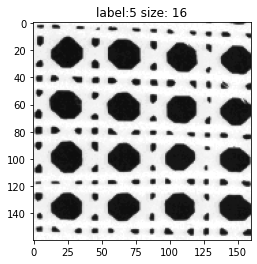

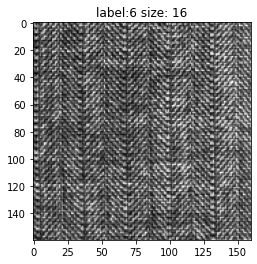

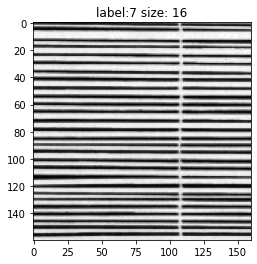

In [12]:
show_histograms(images_sz16)

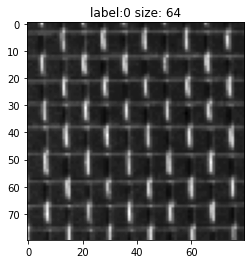

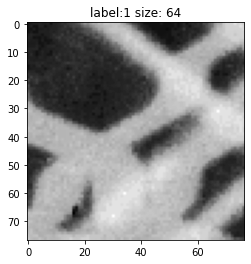

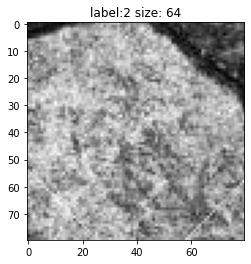

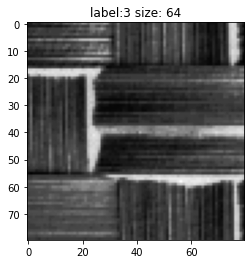

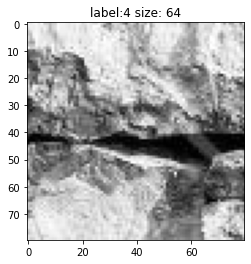

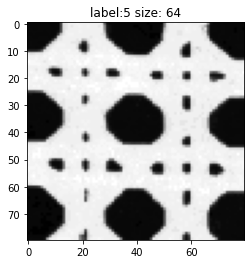

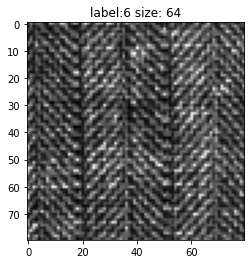

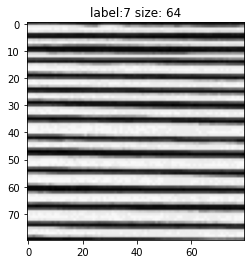

In [13]:
show_histograms(images_sz64)

## GLCM

In [14]:
from skimage.feature import greycomatrix, greycoprops

In [15]:
distances = [1]
angles = [0, np.pi/4, np.pi/2, 3*np.pi/4]

window_sizes = os.listdir(TRAIN_IMAGES_PATH)
window_sizes = [int(c) for c in window_sizes if c[0] != '.']
window_sizes = sorted(window_sizes)

X_train_all = []
y_train_all = []

for size in window_sizes:
    images = os.listdir(TRAIN_IMAGES_PATH + str(size) + '/')
    images = [c for c in images if c[0] != '.']
    X_train = []
    y_train = []
    for image in images:
        name = image.split('_')
        y_train.append(name[0][2:])

        img = cv2.cvtColor(cv2.imread(TRAIN_IMAGES_PATH + str(size) + '/' + image), cv2.COLOR_BGR2GRAY)
        glcm = greycomatrix(img, distances, angles)
        # show_image(glcm[:, :, 0, 0])
        features = [
            np.mean(greycoprops(glcm, 'contrast')),
            np.mean(greycoprops(glcm, 'dissimilarity')),
            np.mean(greycoprops(glcm, 'homogeneity')),
            np.mean(greycoprops(glcm, 'energy')),
            np.mean(greycoprops(glcm, 'correlation')),
            np.mean(greycoprops(glcm, 'ASM')),
        ]
        X_train.append(np.array(features))
    X_train_all.append(X_train)
    y_train_all.append(y_train)

In [16]:
print(len(X_train_all), len(X_train_all[0]), len(X_train_all[0][0]))
print(len(y_train_all), len(y_train_all[0]), len(y_train_all[0][0]))

3 24 6
3 24 1


# 3. Entrenamiento

In [56]:
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier

In [48]:
def get_feature(X_train, feature_idx):
    X_train = np.array(X_train)
    return X_train[:, feature_idx]

X_train_size_4 = np.array(X_train_all[0])
F = []
for i in range(6):
    F.append(get_feature(X_train_size_4, i))

f_df = pd.DataFrame({
    'f0': F[0],
    'f1': F[1],
    'f2': F[2],
    'f3': F[3],
    'f4': F[4],
    'f5': F[5],
})
f_df.head()

,f0,f1,f2,f3,f4,f5
0,936.265378,19.306512,0.133101,0.033249,0.782819,0.001138
1,754.027388,17.185814,0.142667,0.036655,0.777682,0.001386
2,838.319085,18.465178,0.134736,0.034053,0.769566,0.001196
3,1669.289569,16.741043,0.417644,0.180384,0.899410,0.032602
4,1729.369961,17.161277,0.406559,0.185097,0.891911,0.034306


In [51]:
fig = go.Figure()

fig.add_trace(go.Scatter(y=f_df['f0'], mode='markers', name='contrast'))
fig.add_trace(go.Scatter(y=f_df['f1'], mode='markers', name='dissimilarity'))
fig.add_trace(go.Scatter(y=f_df['f2'], mode='markers', name='homogeneity'))
fig.add_trace(go.Scatter(y=f_df['f3'], mode='markers', name='energy'))
fig.add_trace(go.Scatter(y=f_df['f4'], mode='markers', name='correlation'))
fig.add_trace(go.Scatter(y=f_df['f5'], mode='markers', name='ASM'))

fig.update_layout(
    title=dict(text='Espacio de características de Haralick (6)')
)
fig.show()

In [57]:
svm_4 = SVC()
svm_4.fit(X_train_all[0], y_train_all[0])

SVC()

In [58]:
svm_16 = SVC()
svm_16.fit(X_train_all[1], y_train_all[1])

SVC()

In [59]:
svm_64 = SVC()
svm_64.fit(X_train_all[2], y_train_all[2])

SVC()

In [52]:
knn_4 = KNeighborsClassifier()
knn_4.fit(X_train_all[0], y_train_all[0])

KNeighborsClassifier()

In [53]:
knn_16 = KNeighborsClassifier()
knn_16.fit(X_train_all[1], y_train_all[1])

KNeighborsClassifier()

In [54]:
knn_64 = KNeighborsClassifier()
knn_64.fit(X_train_all[2], y_train_all[2])

KNeighborsClassifier()

# 2. Evaluación

In [60]:
distances = [1]
angles = [0, np.pi/4, np.pi/2, 3*np.pi/4]

window_sizes = os.listdir(TEST_IMAGES_PATH)
window_sizes = [int(c) for c in window_sizes if c[0] != '.']
window_sizes = sorted(window_sizes)

X_test_all = []
y_test_all = []

for idx, size in enumerate(window_sizes):
    images = os.listdir(TEST_IMAGES_PATH + str(size) + '/')
    images = [c for c in images if c[0] != '.']
    X_test = []
    y_test = []
    for image in images:
        name = image.split('_')
        y_test.append(name[0][2:])
        img = cv2.cvtColor(cv2.imread(TEST_IMAGES_PATH + str(size) + '/' + image), cv2.COLOR_BGR2GRAY)
        glcm = greycomatrix(img, distances, angles)
        # show_image(glcm[:, :, 0, 0])
        features = [
            np.mean(greycoprops(glcm, 'contrast')),
            np.mean(greycoprops(glcm, 'dissimilarity')),
            np.mean(greycoprops(glcm, 'homogeneity')),
            np.mean(greycoprops(glcm, 'energy')),
            np.mean(greycoprops(glcm, 'correlation')),
            np.mean(greycoprops(glcm, 'ASM')),
        ]
        X_test.append(np.array(features))
    X_test_all.append(X_test)
    y_test_all.append(y_test)

In [61]:
knn4_pred = knn_4.predict(X_test_all[0])
knn16_pred = knn_16.predict(X_test_all[1])
knn64_pred = knn_64.predict(X_test_all[2])

In [62]:
svm4_pred = svm_4.predict(X_test_all[0])
svm16_pred = svm_16.predict(X_test_all[1])
svm64_pred = svm_64.predict(X_test_all[2])

## Evaluación

In [64]:
from sklearn.metrics import accuracy_score

In [69]:
print(f"Knn window size 4: {accuracy_score(y_test_all[0], knn4_pred)}")
print(f"SVM window size 4: {accuracy_score(y_test_all[0], svm4_pred)}")

Knn window size 4: 0.75
SVM window size 4: 0.75


In [70]:
print(f"Knn window size 16: {accuracy_score(y_test_all[1], knn16_pred)}")
print(f"SVM window size 16: {accuracy_score(y_test_all[1], svm16_pred)}")

Knn window size 16: 0.75
SVM window size 16: 0.71875


In [71]:
print(f"Knn window size 64: {accuracy_score(y_test_all[2], knn64_pred)}")
print(f"SVM window size 64: {accuracy_score(y_test_all[2], svm64_pred)}")

Knn window size 64: 0.7211538461538461
SVM window size 64: 0.6826923076923077


## Evaluación sobre imágenes compuestas

In [73]:
images = os.listdir(MIXED_IMAGES_PATH)
images = [c for c in images if c[0] != '.']

distances = [1]
angles = [0, np.pi/4, np.pi/2, 3*np.pi/4]

for image in images:
    img = cv2.cvtColor(cv2.imread(MIXED_IMAGES_PATH + image), cv2.COLOR_BGR2GRAY)
    s_images = split_image(img, num_images=4, verbose=False)
    print(f"Predicting image: {image}")
    for i in s_images:
        glcm = greycomatrix(i, distances, angles)
        # show_image(glcm[:, :, 0, 0])
        features = [
            np.mean(greycoprops(glcm, 'contrast')),
            np.mean(greycoprops(glcm, 'dissimilarity')),
            np.mean(greycoprops(glcm, 'homogeneity')),
            np.mean(greycoprops(glcm, 'energy')),
            np.mean(greycoprops(glcm, 'correlation')),
            np.mean(greycoprops(glcm, 'ASM'))
        ]
        prediction = knn_64.predict(np.array(features).reshape(1,-1))
        print(prediction)

Predicting image: imgCompuesta2.png
['4']
['1']
['2']
['3']
Predicting image: imgCompuesta3.png
['3']
['1']
['2']
['6']
Predicting image: imgCompuesta1.png
['3']
['0']
['2']
['3']
